In [2]:
from PIL import Image
import pandas as pd
import base64
import os
import random
from transformers import AutoProcessor, AutoModelForCausalLM, pipeline
from IPython.display import clear_output
import sys
sys.path.append('src')
import env_options
import image_parser
import requests
hf_token, hf_token_write, openai_api_key = env_options.check_env(dotenv_path="../../apis/.env")

Python version: 3.11.5 | packaged by Anaconda, Inc. | (main, Sep 11 2023, 13:26:23) [MSC v.1916 64 bit (AMD64)]
PyTorch version: 2.2.2
Transformers version: 4.44.2
CUDA device: NVIDIA GeForce RTX 4060 Laptop GPU
CUDA Version: 12.1
FlashAttention available: True
Retrieved token(s) from .env file
Using HuggingFace token: hf_M*****************************IASJ
Using HuggingFace write token: hf_u*****************************Xipx
Using OpenAI token: sk-p************************************************************************************************************************************************************_5sA


<!-- Loading data from my ChatGPT archive. Check below screen capture from the ChatGPT user interface: -->

<img src="imgs/download-chatgpt-archive.png" alt="how to export ChatGPT archive" width="800"/>

In [16]:
read_path = "../../AI/ChatGPT-archives/20241228/dalle-generations/github-notebook-selection"
print(os.listdir(read_path))
write_path = "../talking-to-chatbots-web/wordpress/wp-content/uploads/dalle-images-notebook"
ip = image_parser.ImageParser(hf_token=hf_token, read_path= read_path, write_path=write_path)
# Initialized the dataframe:
display(ip.images_df)

['file-0aNvOCNMOOgSFMtZSXEnmgtI-934d68ca-2822-4458-bdc1-13b7e7919389.webp', 'file-0lwv9EH1AufpJgdzWYYl09MK-8e16fe7d-0295-4c4e-be9b-4cb249d3e2a4.webp', 'file-4GWduyjAVXi3uvU2CDqwlxoi-191e2e74-794e-491c-8fd6-9bcd7afa76a4.webp', 'file-4xQaqR4nLtL9UaMefiq7uq1u-78d04ed2-06c3-4abb-b851-a12d7ad54cd7.webp', 'file-5MGeweVFkHTM3pFYukQZ6jtT-58e34b2d-bfb2-40a0-896e-4eea31a77695.webp', 'file-aqQkPdKG7EA1zm1V3hiBJvNf-7c81196f-4f02-4b87-a48f-5a7faedb7e31.webp', 'file-biudm9xp3nCnxR7IFNuuYfPp-e0c9a1bd-f175-4d8e-93e4-19a23da771f8.webp', 'file-BIVY3zSDkGrmDUvhULV4paL3-b9293ac4-a0b6-4aff-b443-2b05c174bc59.webp', 'file-bswdIRawpDzxINDQY0qH0MlI-4bdfa43c-6bb8-42fa-88c0-f89f43fe316b.webp', 'file-foUUU0WuX4lFevKO2OPGPJ4N-42d39349-1a48-4f89-8fe2-6eb5d0f30f50.webp', 'file-g3ZkFaN5rB3fL50jYohwxMoF-4dc96841-6018-4937-b18d-d421ff6a4b03.webp', 'file-hcj8pEGWFKRe0QgBCZrqQNel-08fcb6e5-7032-44f9-9c48-a6754285378b.webp', 'file-hqTNg5Mr4GtwcSBPv4I4VRu7-b5fdf383-c61f-4e34-a527-5feba02ee7b4.webp', 'file-IAHR7g9PiX3SXrfTcV

,asset_pointer,file_name,caption,img_url
0,file-0aNvOCNMOOgSFMtZSXEnmgtI,file-0aNvOCNMOOgSFMtZSXEnmgtI.png,a woman holding a piece of paper with the word...,https://talkingtochatbots.com/wp-content/uploa...
1,file-0lwv9EH1AufpJgdzWYYl09MK,file-0lwv9EH1AufpJgdzWYYl09MK.png,a man in a leather jacket and sunglasses is si...,https://talkingtochatbots.com/wp-content/uploa...
2,file-4GWduyjAVXi3uvU2CDqwlxoi,file-4GWduyjAVXi3uvU2CDqwlxoi.png,a man standing on a bridge looking at a citysca,https://talkingtochatbots.com/wp-content/uploa...
3,file-4xQaqR4nLtL9UaMefiq7uq1u,file-4xQaqR4nLtL9UaMefiq7uq1u.png,a man sitting in a chair in front of a computer,https://talkingtochatbots.com/wp-content/uploa...
4,file-5MGeweVFkHTM3pFYukQZ6jtT,file-5MGeweVFkHTM3pFYukQZ6jtT.png,a hole in the wall with a light coming through it,https://talkingtochatbots.com/wp-content/uploa...
5,file-aqQkPdKG7EA1zm1V3hiBJvNf,file-aqQkPdKG7EA1zm1V3hiBJvNf.png,a puppy sitting on a sidewalk in the grass,https://talkingtochatbots.com/wp-content/uploa...
6,file-biudm9xp3nCnxR7IFNuuYfPp,file-biudm9xp3nCnxR7IFNuuYfPp.png,"a robot holding a sign that says,'like our sch...",https://talkingtochatbots.com/wp-content/uploa...
7,file-BIVY3zSDkGrmDUvhULV4paL3,file-BIVY3zSDkGrmDUvhULV4paL3.png,a man in a white suit standing on the moon,https://talkingtochatbots.com/wp-content/uploa...
8,file-bswdIRawpDzxINDQY0qH0MlI,file-bswdIRawpDzxINDQY0qH0MlI.png,a man in a black jacket and helmet looking up ...,https://talkingtochatbots.com/wp-content/uploa...
9,file-foUUU0WuX4lFevKO2OPGPJ4N,file-foUUU0WuX4lFevKO2OPGPJ4N.png,a man and woman standing in front of a building,https://talkingtochatbots.com/wp-content/uploa...


In [18]:
print(ip.images_df.img_url.values[0])

https://talkingtochatbots.com/wp-content/uploads/ttcb-images/file-0aNvOCNMOOgSFMtZSXEnmgtI.png


## Convert images from WEBP to PNG

In [3]:
ip.convert_all_images()

Orig. file: file-0aNvOCNMOOgSFMtZSXEnmgtI-934d68ca-2822-4458-bdc1-13b7e7919389 | ['WEBP', (1024, 1792), 'RGB'] | To upload: file-0aNvOCNMOOgSFMtZSXEnmgtI.png
Orig. file: file-0lwv9EH1AufpJgdzWYYl09MK-8e16fe7d-0295-4c4e-be9b-4cb249d3e2a4 | ['WEBP', (1024, 1024), 'RGB'] | To upload: file-0lwv9EH1AufpJgdzWYYl09MK.png
Orig. file: file-4GWduyjAVXi3uvU2CDqwlxoi-191e2e74-794e-491c-8fd6-9bcd7afa76a4 | ['WEBP', (1024, 1024), 'RGB'] | To upload: file-4GWduyjAVXi3uvU2CDqwlxoi.png
Orig. file: file-4xQaqR4nLtL9UaMefiq7uq1u-78d04ed2-06c3-4abb-b851-a12d7ad54cd7 | ['WEBP', (1024, 1024), 'RGB'] | To upload: file-4xQaqR4nLtL9UaMefiq7uq1u.png
Orig. file: file-5MGeweVFkHTM3pFYukQZ6jtT-58e34b2d-bfb2-40a0-896e-4eea31a77695 | ['WEBP', (1024, 1024), 'RGB'] | To upload: file-5MGeweVFkHTM3pFYukQZ6jtT.png
Orig. file: file-aqQkPdKG7EA1zm1V3hiBJvNf-7c81196f-4f02-4b87-a48f-5a7faedb7e31 | ['WEBP', (1024, 1024), 'RGB'] | To upload: file-aqQkPdKG7EA1zm1V3hiBJvNf.png
Orig. file: file-biudm9xp3nCnxR7IFNuuYfPp-e0c9a1bd-f

In [7]:
display(ip.images_df.head(5))
print("...",ip.images_df.shape)

,asset_pointer,file_name,caption,img_url
0,file-0aNvOCNMOOgSFMtZSXEnmgtI,file-0aNvOCNMOOgSFMtZSXEnmgtI.png,,https://talkingtochatbots.com/wp-content/uploa...
1,file-0lwv9EH1AufpJgdzWYYl09MK,file-0lwv9EH1AufpJgdzWYYl09MK.png,,https://talkingtochatbots.com/wp-content/uploa...
2,file-4GWduyjAVXi3uvU2CDqwlxoi,file-4GWduyjAVXi3uvU2CDqwlxoi.png,,https://talkingtochatbots.com/wp-content/uploa...
3,file-4xQaqR4nLtL9UaMefiq7uq1u,file-4xQaqR4nLtL9UaMefiq7uq1u.png,,https://talkingtochatbots.com/wp-content/uploa...
4,file-5MGeweVFkHTM3pFYukQZ6jtT,file-5MGeweVFkHTM3pFYukQZ6jtT.png,,https://talkingtochatbots.com/wp-content/uploa...


... (29, 4)


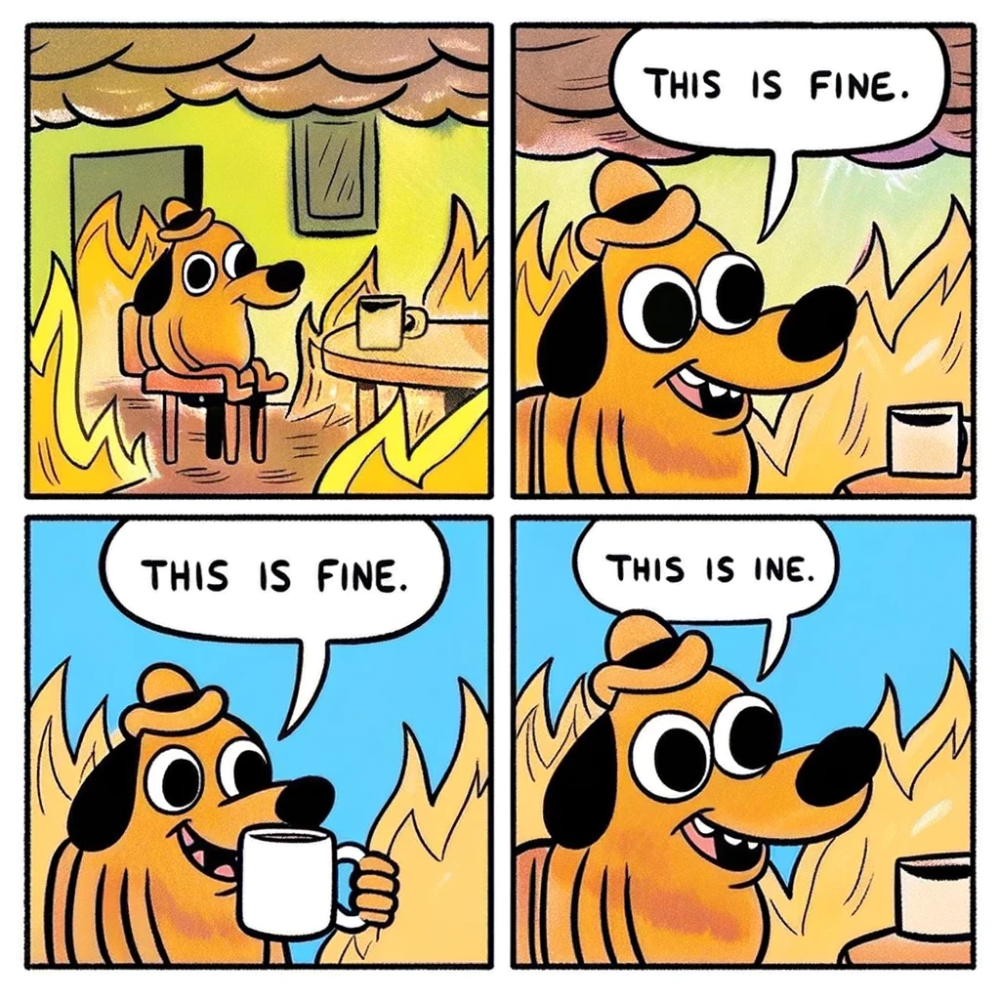

In [ ]:
img_sample = ip.images_df.sample(1).img_url.values[0]
im = Image.open(requests.get(img_sample, stream=True).raw)
display(im, metadata={"image/png": {"width": 700}})

### Caption with BLIP

a skull in a suit with lightnings in the background


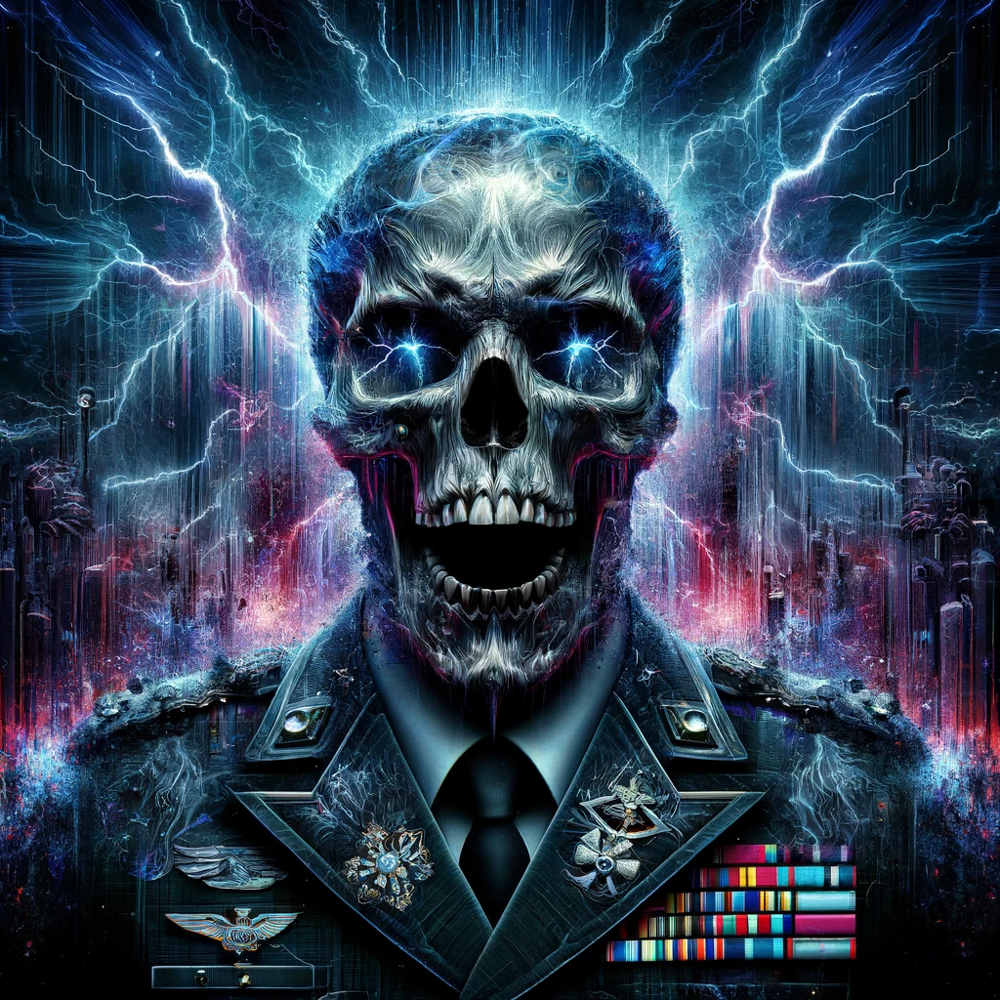

In [9]:
img_files = os.listdir(read_path)
file_sample = random.choice(img_files)
image_path = f'{read_path}/{file_sample}'
caption = ip.caption_image(image_path = image_path, max_new_tokens=30)
clear_output(wait=True)
print(caption)
im = Image.open(f'{read_path}/{file_sample}')
display_settings = {"image/png": {"width": 500}}
display(im, metadata=display_settings)

### Caption all images

In [10]:
ip.caption_all_images()

Captioning images:  90%|████████▉ | 26/29 [00:43<00:05,  1.77s/it]

Processing file file-YOEBjrC3EG2dqEPIknX8mxEl.png | ('PNG', (1024, 1024), 'RGB')


Captioning images:  93%|█████████▎| 27/29 [00:45<00:03,  1.77s/it]

Captioned image file-YOEBjrC3EG2dqEPIknX8mxEl | a robot sitting at a desk in front of a computer
Processing file file-zfpjt7DjQ4S7ByBnvQYfmreL.png | ('PNG', (1024, 1024), 'RGB')


Captioning images:  97%|█████████▋| 28/29 [00:47<00:01,  1.82s/it]

Captioned image file-zfpjt7DjQ4S7ByBnvQYfmreL | a man in a black jacket standing in front of a night sky
Processing file file-ZMeG3ZvMsFByAF1GUaYpmNrp.png | ('PNG', (1024, 1024), 'RGB')


Captioning images: 100%|██████████| 29/29 [00:49<00:00,  1.70s/it]

Captioned image file-ZMeG3ZvMsFByAF1GUaYpmNrp | a robot holding a sign that says i'm'y at loss now


Displaying caption and image (saved locally):

../talking-to-chatbots-web/wordpress/wp-content/uploads/dalle-images-notebook/file-YOEBjrC3EG2dqEPIknX8mxEl.png
a robot sitting at a desk in front of a computer


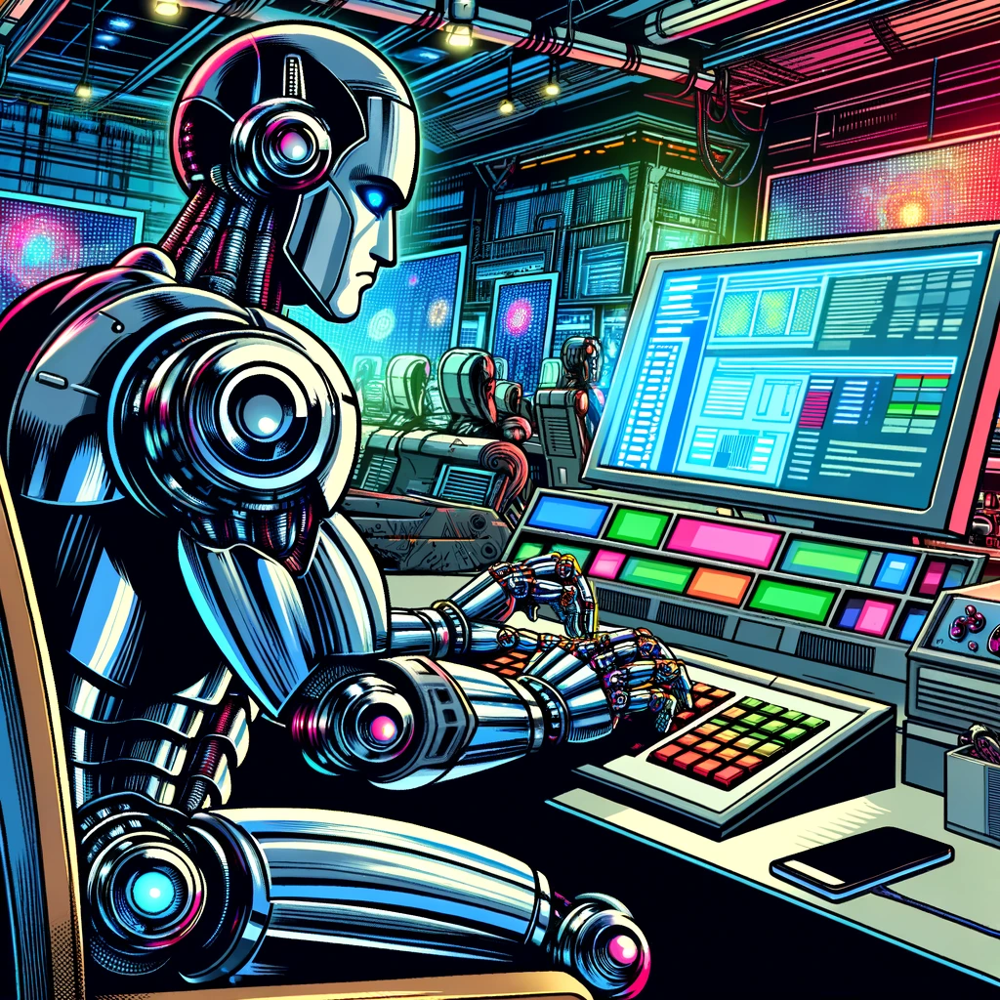

In [36]:
df_sample = ip.images_df.sample(1)
img_sample_path = f"{write_path}/{df_sample.file_name.values[0]}"
print(img_sample_path)
im = Image.open(img_sample_path)
print(df_sample.caption.values[0])
display(im, metadata=display_settings)

Displaying caption and image from the website (after uploading):

https://talkingtochatbots.com/wp-content/uploads/ttcb-images/file-g3ZkFaN5rB3fL50jYohwxMoF.png
a skull in a suit with lightnings in the background


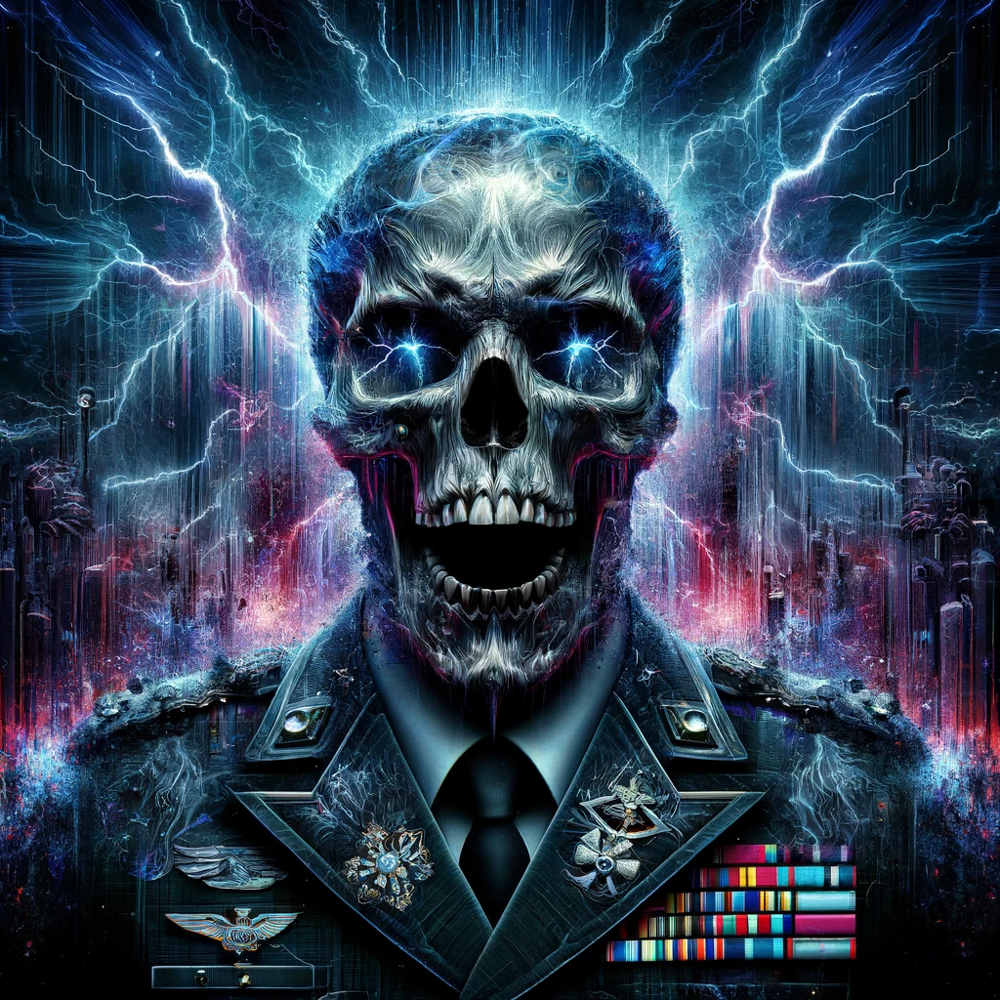

In [20]:
df_sample = ip.images_df.sample(1)
img_sample_url = df_sample.img_url.values[0]
print(img_sample_url)
im = Image.open(requests.get(img_sample_url, stream=True).raw)
print(df_sample.caption.values[0])
display(im, metadata=display_settings)

_____________________________

### Old cells

Keeping these outputs from an older project:

In [8]:
read_path = "../../AI/ChatGPT-archives/20241228/dalle-generations"
write_path = "../../git/talking-to-chatbots-web/wordpress/wp-content/uploads/ttcb-images"
ip_dalle = image_parser.ImageParser(hf_token=hf_token, read_path= read_path, write_path=write_path)

c:\Users\david\anaconda3\Lib\site-packages\transformers\tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


Loaded dataframe | (729, 3)


In [9]:
ip_dalle.convert_all_images()

Orig. file: file-0aNvOCNMOOgSFMtZSXEnmgtI-934d68ca-2822-4458-bdc1-13b7e7919389 | ['WEBP', (1024, 1792), 'RGB'] | To upload: file-0aNvOCNMOOgSFMtZSXEnmgtI.png
Orig. file: file-0F3YiGQ47fcGQoqlAYzAX2wo-b8c88ce0-eb94-4795-a929-5c55ed17ab5d | ['WEBP', (1792, 1024), 'RGB'] | To upload: file-0F3YiGQ47fcGQoqlAYzAX2wo.png
Orig. file: file-0lwv9EH1AufpJgdzWYYl09MK-8e16fe7d-0295-4c4e-be9b-4cb249d3e2a4 | ['WEBP', (1024, 1024), 'RGB'] | To upload: file-0lwv9EH1AufpJgdzWYYl09MK.png
Orig. file: file-0MCeUVT39kKIXGiYsIqN2d4h-d5f801ae-2820-4b04-8510-1e33eed9ac3d | ['WEBP', (1024, 1024), 'RGB'] | To upload: file-0MCeUVT39kKIXGiYsIqN2d4h.png
Orig. file: file-0q7Zh2iY2QsgBSugFXInoLsp-d0feb5ea-4f52-4b96-aeaa-6c36bc543ba3 | ['WEBP', (1024, 1024), 'RGB'] | To upload: file-0q7Zh2iY2QsgBSugFXInoLsp.png
Orig. file: file-0RIyBzGjhZ9bBbKFXtuyWf2d-749bec42-a882-4033-b139-30b8a64c9730 | ['WEBP', (1024, 1024), 'RGB'] | To upload: file-0RIyBzGjhZ9bBbKFXtuyWf2d.png
Orig. file: file-0tZXCRZUiiex0QGT67S8ZsXa-b6465872-8

In [11]:
ip_dalle.images_df

,asset_pointer,file_name,caption
0,file-011PxqbBKoLPzoPowZptLt9t,file-011PxqbBKoLPzoPowZptLt9t.png,
1,file-02dxk0e9IKAQTCEeR8N7qnQT,file-02dxk0e9IKAQTCEeR8N7qnQT.png,
2,file-0LAse7fOI1qPhhEAqGuTmNN6,file-0LAse7fOI1qPhhEAqGuTmNN6.png,
3,file-0m2dmvHfZYy8LD88oK1JCOHL,file-0m2dmvHfZYy8LD88oK1JCOHL.png,
4,file-0NpK2d4UY9T0xzRKSKMYLSiL,file-0NpK2d4UY9T0xzRKSKMYLSiL.png,
...,...,...,...
981,file-zMJlzda5jjE4Xd9ZQ6I8drh5,file-zMJlzda5jjE4Xd9ZQ6I8drh5.png,
982,file-zorDCUiHEPkfd5NvWvgGXN2M,file-zorDCUiHEPkfd5NvWvgGXN2M.png,
983,file-ZQ0NdwabywrMYtj7QItSPyTL,file-ZQ0NdwabywrMYtj7QItSPyTL.png,
984,file-ZsVrAXmUVFTZwUOAMLITyngl,file-ZsVrAXmUVFTZwUOAMLITyngl.png,


In [12]:
df_images = ip_dalle.images_df.copy()

In [23]:
df_images['img_url'] = df_images['file_name'].apply(lambda x: f"https://talkingtochatbots.com/wp-content/uploads/ttcb-images/{x}")

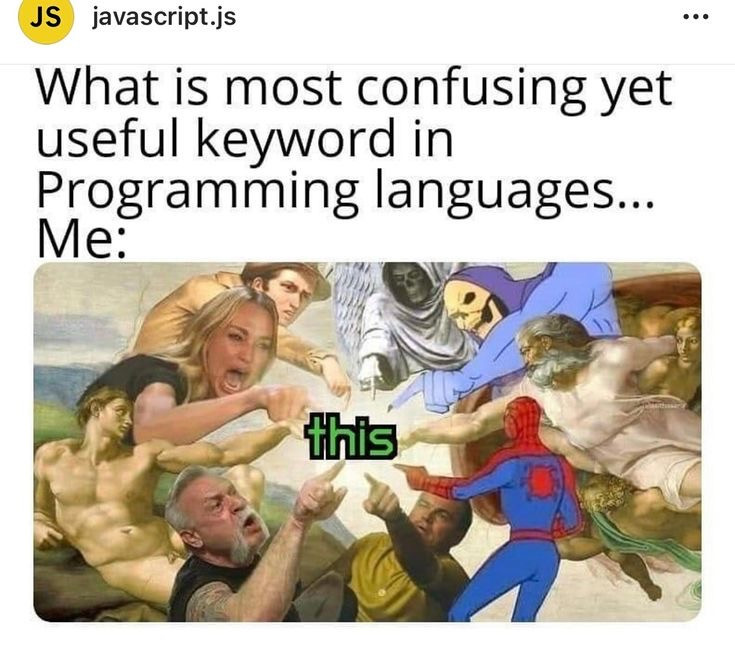

In [42]:
img_sample = df_images.sample(1).img_url.values[0]
im = Image.open(requests.get(img_sample, stream=True).raw)
display(im)

## Captioning test

In [70]:
ip_captions = image_parser.ImageParser(hf_token=hf_token, read_path= read_path, write_path=write_path)

Loaded dataframe | (986, 3)


Processing file file-t6hmEbCL2mbLjPZdCSdS8Pwj-d74617e7-8e48-4807-a8ca-0b31687435c2.webp | ('WEBP', (1024, 1024), 'RGB')


c:\Users\david\anaconda3\Lib\site-packages\transformers\tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


a cat sitting at a computer with a mathematical equation on the screen


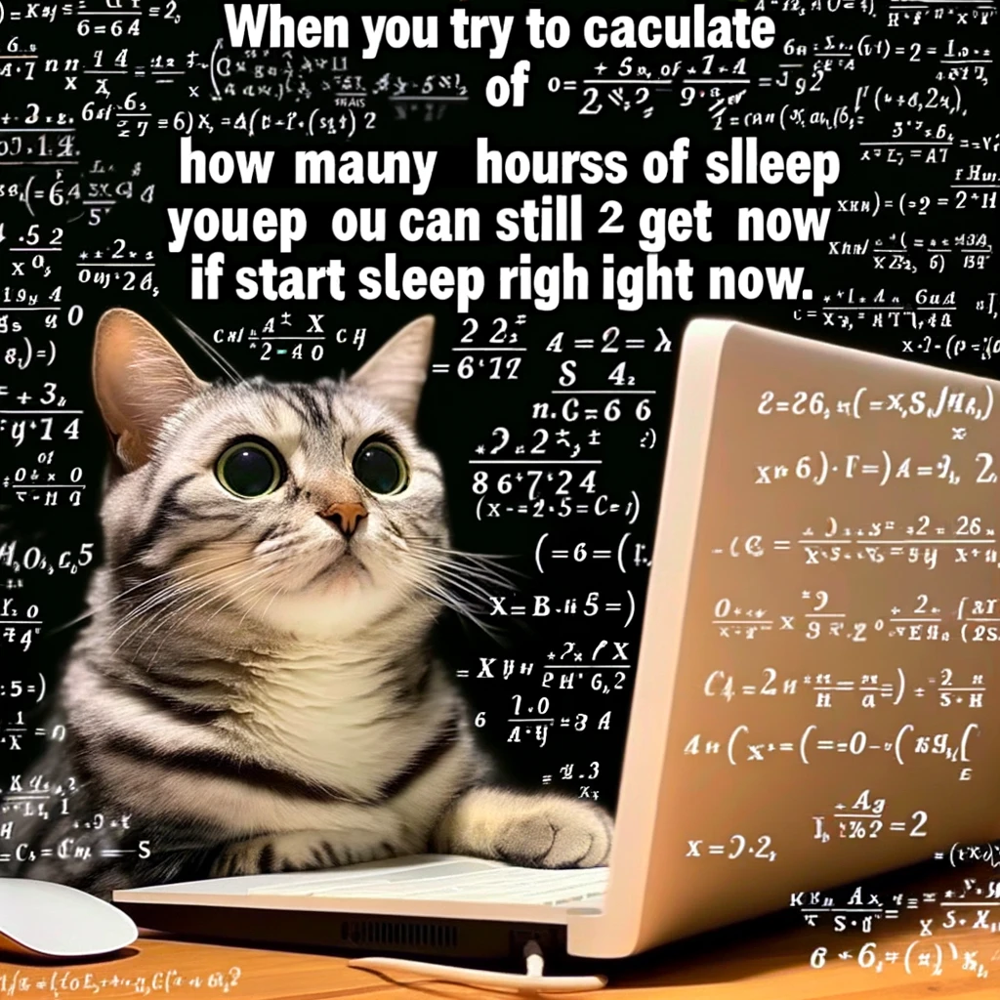

In [71]:
img_files = os.listdir(read_path)
file_sample = random.choice(img_files)
image_path = f'{read_path}/{file_sample}'
caption = ip_captions.caption_image(image_path = image_path, max_new_tokens=30)
print(caption)
im = Image.open(f'{read_path}/{file_sample}')
display(im)

## Get captions

In [72]:
ip_captions = image_parser.ImageParser(hf_token=hf_token, read_path= read_path, write_path=write_path)

Loaded dataframe | (986, 3)


In [73]:
ip_captions.caption_all_images()

Captioning images: 100%|██████████| 986/986 [23:40<00:00,  1.44s/it]


In [74]:
ip_captions.images_df

,asset_pointer,file_name,caption
0,file-011PxqbBKoLPzoPowZptLt9t,file-011PxqbBKoLPzoPowZptLt9t.png,the screen showing the settings for the game
1,file-02dxk0e9IKAQTCEeR8N7qnQT,file-02dxk0e9IKAQTCEeR8N7qnQT.png,a woman in a bikini top and sunglasses
2,file-0LAse7fOI1qPhhEAqGuTmNN6,file-0LAse7fOI1qPhhEAqGuTmNN6.png,the reddits account screen
3,file-0m2dmvHfZYy8LD88oK1JCOHL,file-0m2dmvHfZYy8LD88oK1JCOHL.png,the new twitter page for the easter bunny
4,file-0NpK2d4UY9T0xzRKSKMYLSiL,file-0NpK2d4UY9T0xzRKSKMYLSiL.png,a screenshot of a code with a number of code n...
...,...,...,...
981,file-zMJlzda5jjE4Xd9ZQ6I8drh5,file-zMJlzda5jjE4Xd9ZQ6I8drh5.png,a man standing in the middle of a street with ...
982,file-zorDCUiHEPkfd5NvWvgGXN2M,file-zorDCUiHEPkfd5NvWvgGXN2M.png,a set of mathematical symbols
983,file-ZQ0NdwabywrMYtj7QItSPyTL,file-ZQ0NdwabywrMYtj7QItSPyTL.png,a cartoon depicting a man looking at a painting
984,file-ZsVrAXmUVFTZwUOAMLITyngl,file-ZsVrAXmUVFTZwUOAMLITyngl.png,a large hole in the ceiling


In [76]:
images_df = pd.read_pickle('pkl/images_df.pkl')

In [78]:
images_df['img_url'] = images_df['file_name'].apply(lambda x: f"https://talkingtochatbots.com/wp-content/uploads/ttcb-images/{x}")

In [93]:
display(images_df)

,asset_pointer,file_name,caption,img_url
0,file-011PxqbBKoLPzoPowZptLt9t,file-011PxqbBKoLPzoPowZptLt9t.png,the screen showing the settings for the game,https://talkingtochatbots.com/wp-content/uploa...
1,file-02dxk0e9IKAQTCEeR8N7qnQT,file-02dxk0e9IKAQTCEeR8N7qnQT.png,a woman in a bikini top and sunglasses,https://talkingtochatbots.com/wp-content/uploa...
2,file-0LAse7fOI1qPhhEAqGuTmNN6,file-0LAse7fOI1qPhhEAqGuTmNN6.png,the reddits account screen,https://talkingtochatbots.com/wp-content/uploa...
3,file-0m2dmvHfZYy8LD88oK1JCOHL,file-0m2dmvHfZYy8LD88oK1JCOHL.png,the new twitter page for the easter bunny,https://talkingtochatbots.com/wp-content/uploa...
4,file-0NpK2d4UY9T0xzRKSKMYLSiL,file-0NpK2d4UY9T0xzRKSKMYLSiL.png,a screenshot of a code with a number of code n...,https://talkingtochatbots.com/wp-content/uploa...
...,...,...,...,...
981,file-zMJlzda5jjE4Xd9ZQ6I8drh5,file-zMJlzda5jjE4Xd9ZQ6I8drh5.png,a man standing in the middle of a street with ...,https://talkingtochatbots.com/wp-content/uploa...
982,file-zorDCUiHEPkfd5NvWvgGXN2M,file-zorDCUiHEPkfd5NvWvgGXN2M.png,a set of mathematical symbols,https://talkingtochatbots.com/wp-content/uploa...
983,file-ZQ0NdwabywrMYtj7QItSPyTL,file-ZQ0NdwabywrMYtj7QItSPyTL.png,a cartoon depicting a man looking at a painting,https://talkingtochatbots.com/wp-content/uploa...
984,file-ZsVrAXmUVFTZwUOAMLITyngl,file-ZsVrAXmUVFTZwUOAMLITyngl.png,a large hole in the ceiling,https://talkingtochatbots.com/wp-content/uploa...


In [94]:
images_df.to_pickle('pkl/images/images_df.pkl')

a man in a white space suit on the moon


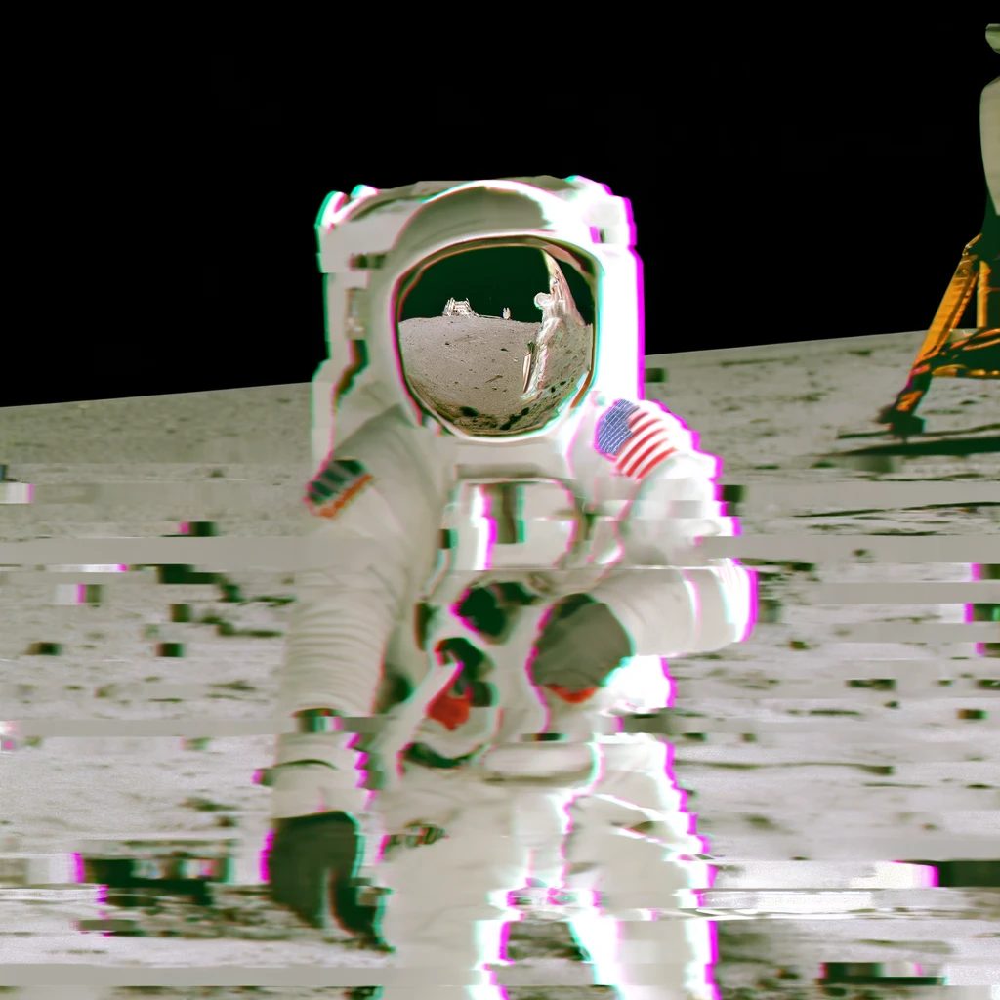

In [92]:
df_sample = images_df.sample(1)
img_sample = df_sample.img_url.values[0]
im = Image.open(requests.get(img_sample, stream=True).raw)
print(df_sample.caption.values[0])
display(im)

## Test code

In [26]:
captioner = pipeline("image-to-text", model="Salesforce/blip-image-captioning-base", device=0)

c:\Users\david\anaconda3\Lib\site-packages\transformers\tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


In [34]:
path="../../AI/ChatGPT-archives/20241228"
# read the folder and store all file names in a list
# img_folder = path
img_folder = f"{path}/dalle-generations"
img_files = os.listdir(img_folder)
# print(img_files)


file_sample = random.choice(img_files)
print(file_sample)

file_extension = file_sample.split('.')[-1]
complete_file_name = file_sample.rsplit('.', 1)[0]
img_pointer = '-'.join(file_sample.split('-')[:2])

#print(f"File Extension: {file_extension}")
#print(f"File Name: {complete_file_name}")
print(f"Img pointer: {img_pointer}")

image_orig = f'{img_folder}/{file_sample}'
# image_webp = f'{path}/{file_sample}'
image_png = f'{path}/TESTS/{img_pointer}.png'

try:
    im = Image.open(image_orig)
    print(im.format, im.size, im.mode)
except (IOError, ValueError) as e:
    print(f"Cannot process file: {file_sample}. Error: {e}")


im.save(image_png, format="png", lossless=True)
im_png = Image.open(image_png)
print(im_png.format, im_png.size, im_png.mode)

itt_output = captioner(im)
caption = itt_output[0].get('generated_text')
print(caption)

file-KuZVi413qfCDYQmtNktwDhaH-8081758b-1461-4f8f-93f7-d18ecf546464.webp
Img pointer: file-KuZVi413qfCDYQmtNktwDhaH
WEBP (1024, 1024) RGB
PNG (1024, 1024) RGB
a man in a suit sitting at a desk with a computer


_____________

In [16]:
# read the folder imgs and store all file names in a list
img_folder = 'imgs'
img_files = os.listdir(img_folder)
print(img_files)

['file-AczTlsVyqdoQCGDwNGpzVNB2-IMG_6451.png', 'file-AczTlsVyqdoQCGDwNGpzVNB2-IMG_6451.webp', 'llms-delve.png', 'to_upload']


In [18]:
file_name_1 = img_files[1]
print(file_name_1)

file_extension = file_name_1.split('.')[-1]
complete_file_name = file_name_1.rsplit('.', 1)[0]
img_pointer = '-'.join(file_name_1.split('-')[:2])

print(f"File Extension: {file_extension}")
print(f"File Name: {complete_file_name}")
print(f"Img pointer: {img_pointer}")

image_webp = f'imgs/{file_name_1}'
image_png = f'imgs/to_upload/{complete_file_name}.png'

im = Image.open(image_webp)
print(im.format, im.size, im.mode)

file-AczTlsVyqdoQCGDwNGpzVNB2-IMG_6451.webp
File Extension: webp
File Name: file-AczTlsVyqdoQCGDwNGpzVNB2-IMG_6451
Img pointer: file-AczTlsVyqdoQCGDwNGpzVNB2
WEBP (1024, 1024) RGB


In [19]:
im.save(image_png, format="png", lossless=True)
im_png = Image.open(image_png)
print(im_png.format, im_png.size, im_png.mode)

PNG (1024, 1024) RGB
